In [ ]:
#importing Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import pylab
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score


In [ ]:
#data read
data1=pd.read_csv('/content/train_features.csv')
data2=pd.read_csv('/content/train_salaries.csv')

In [ ]:
pd.options.display.max_columns=None

In [ ]:
data1.head()

,jobId,companyId,jobType,degree,major,industry,yearsExperience,milesFromMetropolis
0,JOB1362684407687,COMP37,CFO,MASTERS,MATH,HEALTH,10,83
1,JOB1362684407688,COMP19,CEO,HIGH_SCHOOL,NONE,WEB,3,73
2,JOB1362684407689,COMP52,VICE_PRESIDENT,DOCTORAL,PHYSICS,HEALTH,10,38
3,JOB1362684407690,COMP38,MANAGER,DOCTORAL,CHEMISTRY,AUTO,8,17
4,JOB1362684407691,COMP7,VICE_PRESIDENT,BACHELORS,PHYSICS,FINANCE,8,16


In [ ]:
#merge dataset
data=pd.merge(data1,data2,how='inner',on='jobId')

In [ ]:
data.head()

,jobId,companyId,jobType,degree,major,industry,yearsExperience,milesFromMetropolis,salary
0,JOB1362684407687,COMP37,CFO,MASTERS,MATH,HEALTH,10,83,130
1,JOB1362684407688,COMP19,CEO,HIGH_SCHOOL,NONE,WEB,3,73,101
2,JOB1362684407689,COMP52,VICE_PRESIDENT,DOCTORAL,PHYSICS,HEALTH,10,38,137
3,JOB1362684407690,COMP38,MANAGER,DOCTORAL,CHEMISTRY,AUTO,8,17,142
4,JOB1362684407691,COMP7,VICE_PRESIDENT,BACHELORS,PHYSICS,FINANCE,8,16,163


In [ ]:
data.shape

(309461, 9)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 309461 entries, 0 to 309460
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   jobId                309461 non-null  object
 1   companyId            309461 non-null  object
 2   jobType              309461 non-null  object
 3   degree               309461 non-null  object
 4   major                309461 non-null  object
 5   industry             309461 non-null  object
 6   yearsExperience      309461 non-null  int64 
 7   milesFromMetropolis  309461 non-null  int64 
 8   salary               309461 non-null  int64 
dtypes: int64(3), object(6)
memory usage: 23.6+ MB


In [ ]:
data.describe()

,yearsExperience,milesFromMetropolis,salary
count,309461.000000,309461.000000,309461.000000
mean,11.980944,49.475301,116.061904
std,7.208780,28.876363,38.772455
min,0.000000,0.000000,0.000000
25%,6.000000,25.000000,88.000000
50%,12.000000,49.000000,114.000000
75%,18.000000,74.000000,141.000000
max,24.000000,99.000000,294.000000


yearsExperience           AxesSubplot(0.125,0.71587;0.110714x0.16413)
milesFromMetropolis    AxesSubplot(0.257857,0.71587;0.110714x0.16413)
salary                 AxesSubplot(0.390714,0.71587;0.110714x0.16413)
dtype: object

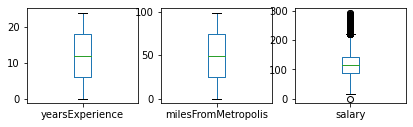

In [ ]:
data.plot(kind='box',subplots='true',layout=(4,6),figsize=(14, 8))

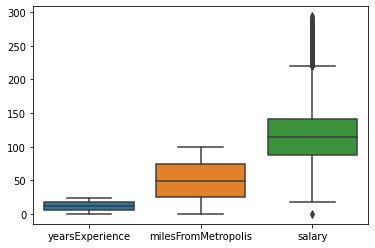

In [ ]:
sns.boxplot(data=data)

In [ ]:
#calculate the quartile values Q1,Q2,Q3.

Q1=np.percentile(data['salary'],25,interpolation='midpoint')
Q2=np.percentile(data['salary'],50,interpolation='midpoint')
Q3=np.percentile(data['salary'],75,interpolation='midpoint')

#Calculate the Inter quartile range(IQR)

IQR=Q3-Q1

#Calculate the upper and lower limit.

upper_limit=Q3+(1.5*IQR)
lower_limit=Q1-(1.5*IQR)

#print upper limit and lower limit

print('Upper Limit: ',upper_limit)
print('Lower Limit: ',lower_limit)

Upper Limit:  220.5
Lower Limit:  8.5


In [ ]:
# Finding the outlier values

outliers=[]
for x in data['salary']:
  if x > upper_limit or x < lower_limit:
    outliers.append(x)

# print outliers

print(outliers)

[223, 223, 248, 240, 225, 247, 229, 232, 225, 241, 225, 238, 234, 243, 237, 222, 232, 230, 231, 230, 221, 233, 254, 235, 243, 229, 239, 226, 243, 229, 259, 221, 259, 240, 221, 283, 236, 229, 224, 241, 233, 237, 222, 226, 221, 243, 237, 243, 228, 236, 236, 221, 236, 225, 273, 271, 229, 254, 226, 255, 240, 236, 227, 221, 228, 236, 251, 246, 240, 243, 226, 221, 254, 236, 224, 259, 243, 221, 240, 234, 235, 237, 226, 229, 223, 230, 226, 224, 239, 223, 238, 225, 221, 224, 227, 229, 249, 231, 224, 245, 233, 229, 226, 225, 235, 224, 245, 222, 221, 230, 228, 221, 248, 226, 231, 223, 227, 221, 228, 258, 232, 244, 230, 237, 230, 223, 225, 254, 224, 221, 221, 247, 226, 224, 223, 265, 223, 263, 227, 221, 221, 228, 252, 225, 247, 269, 225, 232, 242, 266, 241, 224, 237, 242, 228, 228, 264, 224, 239, 242, 222, 253, 221, 251, 221, 233, 238, 240, 239, 248, 221, 258, 233, 245, 221, 238, 249, 222, 231, 239, 224, 221, 222, 229, 236, 253, 222, 226, 227, 263, 228, 241, 270, 246, 225, 225, 221, 224, 268, 253,

In [ ]:
len(outliers)

2232

In [ ]:
#take the index of outlier values and store it in a variable.

index1=data[data['salary']>upper_limit].index
index2=data[data['salary']<lower_limit].index
index1

Int64Index([   266,    362,    560,    670,    719,    966,    986,   1211,
              1222,   1413,
            ...
            308544, 308671, 308723, 308748, 308959, 309100, 309170, 309311,
            309360, 309368],
           dtype='int64', length=2231)

In [ ]:
len(index1)

2231

In [ ]:
len(index2)

1

In [ ]:
#Drop all the rows having outlier values.

data.drop(index1,inplace=True)
data.drop(index2,inplace=True)

yearsExperience           AxesSubplot(0.125,0.71587;0.110714x0.16413)
milesFromMetropolis    AxesSubplot(0.257857,0.71587;0.110714x0.16413)
salary                 AxesSubplot(0.390714,0.71587;0.110714x0.16413)
dtype: object

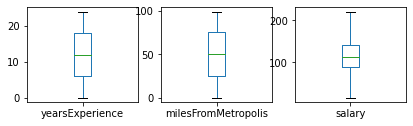

In [ ]:
data.plot(kind='box',subplots='true',layout=(4,6),figsize=(14, 8))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdf32590e10>,
      dtype=object)

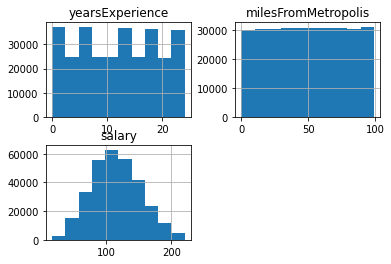

In [ ]:
data.hist()

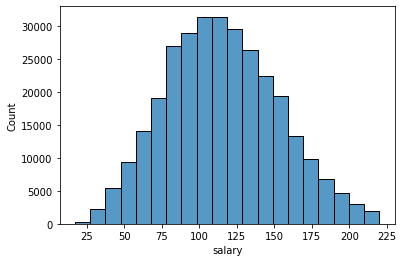

In [ ]:
sns.histplot(data['salary'],bins=20)

In [ ]:
data.columns

Index(['jobId', 'companyId', 'jobType', 'degree', 'major', 'industry',
       'yearsExperience', 'milesFromMetropolis', 'salary'],
      dtype='object')

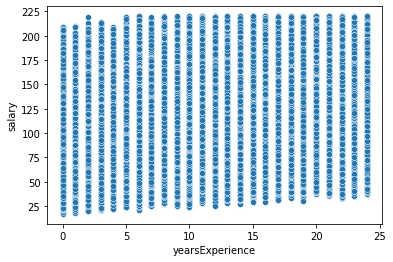

In [ ]:
sns.scatterplot(x='yearsExperience',y='salary',data=data)

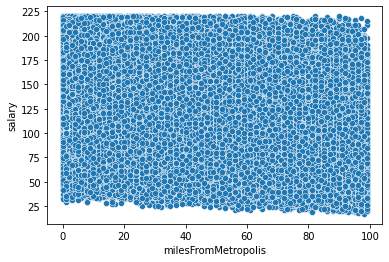

In [ ]:
sns.scatterplot(x='milesFromMetropolis',y='salary',data=data)

In [ ]:
data.columns

Index(['jobId', 'companyId', 'jobType', 'degree', 'major', 'industry',
       'yearsExperience', 'milesFromMetropolis', 'salary'],
      dtype='object')

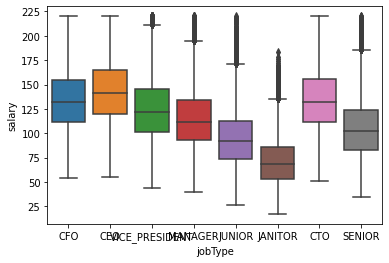

In [ ]:
sns.boxplot(x='jobType',y='salary',data=data)

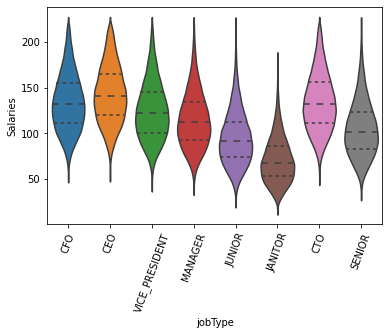

In [ ]:
sns.violinplot(x = data.jobType, y = data['salary'], data = data, scale = 'count', inner = 'quartile')
plt.xticks(rotation = 70)
plt.ylabel('Salaries')
plt.show()

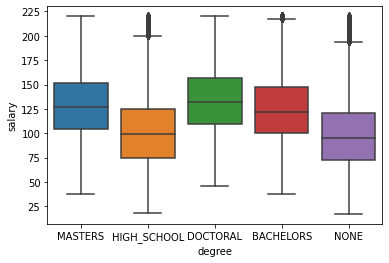

In [ ]:
sns.boxplot(x='degree',y='salary',data=data)

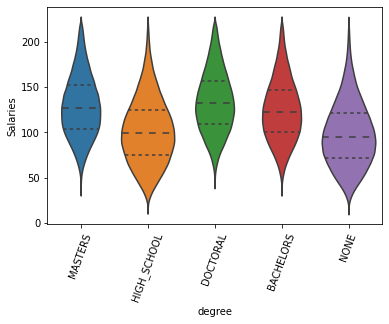

In [ ]:
sns.violinplot(x = data.degree, y = data['salary'], data = data, scale = 'count', inner = 'quartile')
plt.xticks(rotation = 70)
plt.ylabel('Salaries')
plt.show()

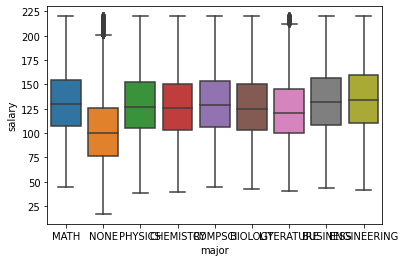

In [ ]:
sns.boxplot(x='major',y='salary',data=data)

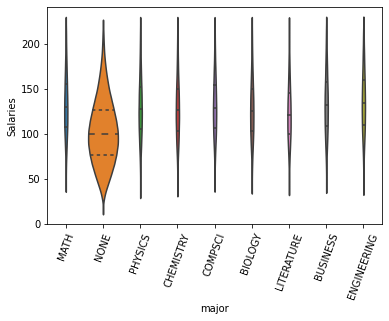

In [ ]:
sns.violinplot(x = data.major, y = data['salary'], data = data, scale = 'count', inner = 'quartile')
plt.xticks(rotation = 70)
plt.ylabel('Salaries')
plt.show()

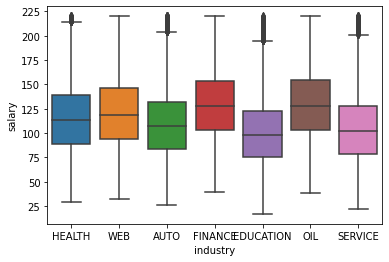

In [ ]:
sns.boxplot(x='industry',y='salary',data=data)

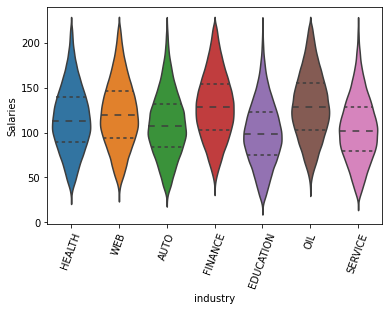

In [ ]:
sns.violinplot(x = data.industry, y = data['salary'], data = data, scale = 'count', inner = 'quartile')
plt.xticks(rotation = 70)
plt.ylabel('Salaries')
plt.show()

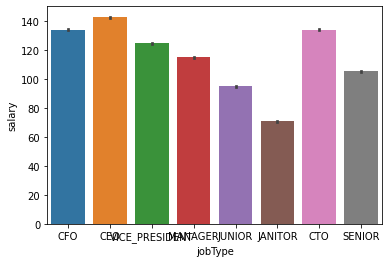

In [ ]:
sns.barplot(x='jobType',y='salary',data=data);

Mean salary

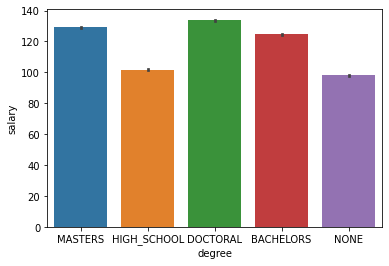

In [ ]:
sns.barplot(x='degree',y='salary',data=data);


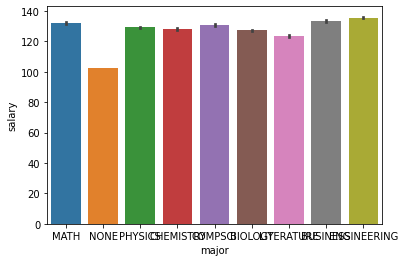

In [ ]:

sns.barplot(x='major',y='salary',data=data);

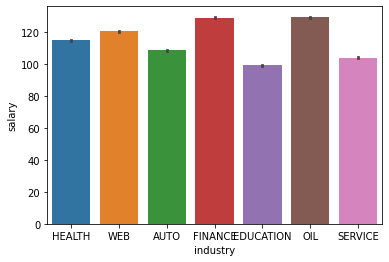

In [ ]:
sns.barplot(x='industry',y='salary',data=data);

In [ ]:
data.columns

Index(['jobId', 'companyId', 'jobType', 'degree', 'major', 'industry',
       'yearsExperience', 'milesFromMetropolis', 'salary'],
      dtype='object')

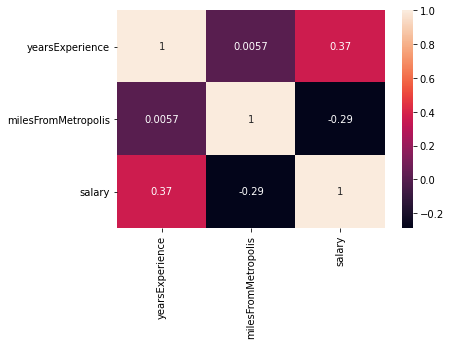

In [ ]:
sns.heatmap(data.corr(),annot=True)

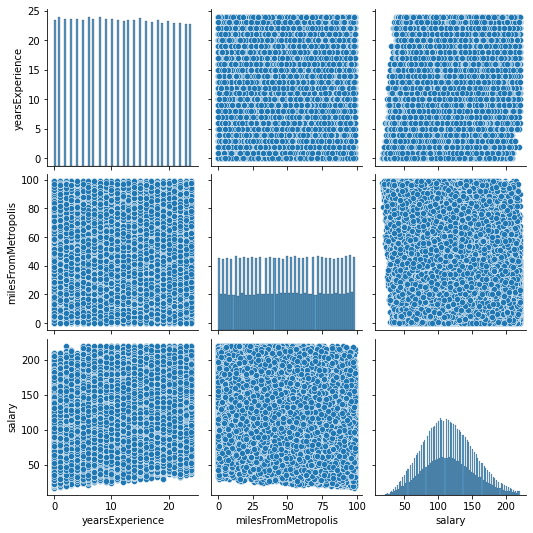

In [ ]:
sns.pairplot(data)

In [ ]:
data.columns

Index(['jobId', 'companyId', 'jobType', 'degree', 'major', 'industry',
       'yearsExperience', 'milesFromMetropolis', 'salary'],
      dtype='object')

In [ ]:
data['jobType'].value_counts()

JANITOR           38961
SENIOR            38835
VICE_PRESIDENT    38746
JUNIOR            38467
MANAGER           38451
CTO               38322
CEO               37743
CFO               37704
Name: jobType, dtype: int64

In [ ]:
data['degree'].value_counts()

NONE           73763
HIGH_SCHOOL    73129
BACHELORS      53540
MASTERS        53489
DOCTORAL       53308
Name: degree, dtype: int64

In [ ]:
data['major'].value_counts()

NONE           164877
LITERATURE      18006
PHYSICS         17899
BIOLOGY         17876
CHEMISTRY       17826
BUSINESS        17779
COMPSCI         17754
ENGINEERING     17644
MATH            17568
Name: major, dtype: int64

In [ ]:
data['industry'].value_counts()

SERVICE      44160
EDUCATION    44072
HEALTH       44055
AUTO         44007
WEB          43728
FINANCE      43677
OIL          43530
Name: industry, dtype: int64

In [ ]:
#Assign all the independent variables to X

X=data.drop(['jobId','companyId','salary'],axis=1)

#Assign the target variable to y

y=data['salary']

In [ ]:
from sklearn.preprocessing import LabelEncoder
label=LabelEncoder()
for i in ['jobType','degree','major','industry']:
  X[i]= label.fit_transform(X[i])

In [ ]:
X.head()

,jobType,degree,major,industry,yearsExperience,milesFromMetropolis
0,1,3,6,3,10,83
1,0,2,7,6,3,73
2,7,1,8,3,10,38
3,5,1,2,0,8,17
4,7,0,8,2,8,16


In [ ]:

#assign training datas into X_train,y_train and testing data into X_test and y_test.

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30,random_state=42)

In [ ]:
#Create an instance for standard scaling.

sc=StandardScaler()

#do standard scaling in X_train

X_train=sc.fit_transform(X_train)

#do standard scaling in X_test

X_test=sc.fit_transform(X_test)



In [ ]:
# Random Forest Regression - scaling


# Creating instance of Random Forest Regression model
RandomForestRigModel = RandomForestRegressor()

# Fitting the instance created
RandomForestRigModel.fit(X_train,y_train)

# Predicting values using the model
predictions = RandomForestRigModel.predict(X_test)


# MSE value
mse = mean_squared_error(y_test, predictions)
mse
# R2 score
r2s = r2_score(y_test, predictions)
r2s
# RMSE
rms = np.sqrt(mse)
rms

20.45180059504156

In [ ]:
r2s

0.704306275658109

In [ ]:
mse

418.27614757934236

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


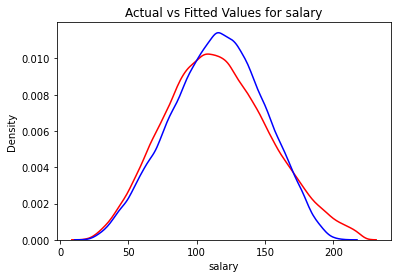

In [ ]:
sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(predictions, hist=False, color="b", label="Fitted Values")


plt.title('Actual vs Fitted Values for salary')



plt.show()
plt.close()

In [ ]:
# Trying Linear Regression


# Creating instance of Linear Regression model
lr = LinearRegression(normalize = True)

# Fitting the instance created
model = lr.fit(X_train, y_train)

# Predicting values using the model
y_pred = model.predict(X_test)

# Description

# MSE value
mse_lr = mean_squared_error(y_test, y_pred)
# R2 score
r2s_lr = r2_score(y_test, y_pred)
# RMSE
rms_lr = np.sqrt(mse)

In [ ]:
mse_lr

893.8618715448575

In [ ]:
r2s_lr

0.3680984503325634

In [ ]:
rms_lr

20.45180059504156

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


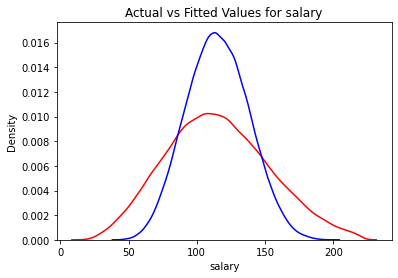

In [ ]:
sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred, hist=False, color="b", label="Fitted Values")


plt.title('Actual vs Fitted Values for salary')



plt.show()
plt.close()

In [ ]:
#Lasso
from sklearn.linear_model import Lasso
las=Lasso(alpha=10.0)
las.fit(X_train,y_train)
y_pred_ls=las.predict(X_test)
r2_ls=r2_score(y_test,y_pred_ls)
mse=mean_squared_error(y_test,y_pred_ls)

In [ ]:
r2_ls

0.07498578464159522

In [ ]:
mse

1308.4869600035265

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


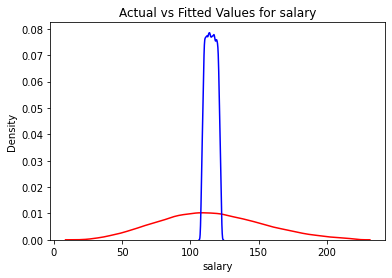

In [ ]:
sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred_ls, hist=False, color="b", label="Fitted Values")


plt.title('Actual vs Fitted Values for salary')



plt.show()
plt.close()

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
mse_values=[]
r2_values=[]
degree=range(2,8)
for i in degree:
  pr_features=PolynomialFeatures(degree=i)
  X_train_poly=pr_features.fit_transform(X_train)
  X_test_poly=pr_features.fit_transform(X_test)
  pr_model=LinearRegression()
  pr_model.fit(X_train_poly,y_train)
  y_pred_pr=pr_model.predict(X_test_poly)
  mse=mean_squared_error(y_test,y_pred_pr)
  r2=r2_score(y_test,y_pred_pr)
  mse_values.append(mse)
  r2_values.append(r2)

In [ ]:
mse_values

[661.4797972423195,
 628.2137271754034,
 1373764191.1754105,
 8.8639581642647e+17,
 1.760038652731321e+18,
 190907609883685.84]

In [ ]:
r2_values

[0.5323772919984684,
 0.5558942154693169,
 -971159.9242052906,
 -626623539776424.5,
 -1244231561430568.5,
 -134959123292.08209]

In [ ]:
pr_features=PolynomialFeatures(degree=3)
X_train_poly=pr_features.fit_transform(X_train)
X_test_poly=pr_features.fit_transform(X_test)
pr_model=LinearRegression()
pr_model.fit(X_train_poly,y_train)
y_pred_pr=pr_model.predict(X_test_poly)
mse=mean_squared_error(y_test,y_pred_pr)
r2=r2_score(y_test,y_pred_pr)

In [ ]:
mse

628.2137271754034

In [ ]:
r2

0.5558942154693169

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


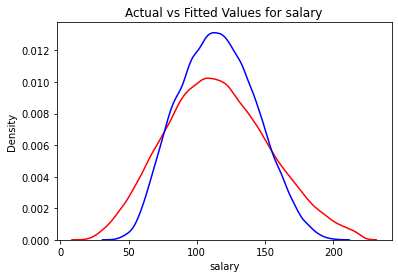

In [ ]:
sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred_pr, hist=False, color="b", label="Fitted Values")


plt.title('Actual vs Fitted Values for salary')



plt.show()
plt.close()

In [ ]:
#ElasticNetRegression
from numpy import mean
from numpy import std
from numpy import absolute
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet

# define model

model_enet = ElasticNet(alpha = 0.01)
model_enet.fit(X_train, y_train)
pred_train_enet= model_enet.predict(X_train)
print(np.sqrt(mean_squared_error(y_train,pred_train_enet)))
print(r2_score(y_train, pred_train_enet))

pred_test_enet= model_enet.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,pred_test_enet)))
print(r2_score(y_test, pred_test_enet))

29.84266957762032
0.36776170680393727
29.898017213947078
0.3680775520980841


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


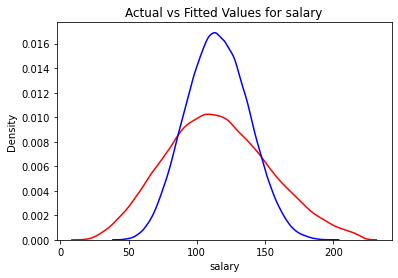

In [ ]:
sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(pred_test_enet, hist=False, color="b", label="Fitted Values")


plt.title('Actual vs Fitted Values for salary')



plt.show()
plt.close()

In [ ]:
# Fitting Decision Tree Regression to the dataset
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor()
regressor.fit(X_train,y_train)
y_pred_dt = regressor.predict(X_test)
mse=mean_squared_error(y_test,y_pred_dt)
r2=r2_score(y_test,y_pred_dt)


In [ ]:
mse

711.2484080029318

In [ ]:
r2

0.49719415770717856

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


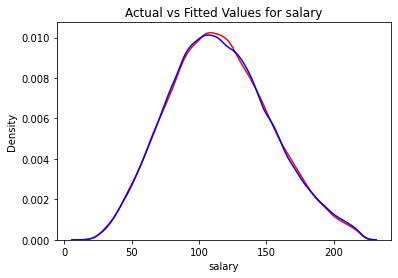

In [ ]:
sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred_dt, hist=False, color="b", label="Fitted Values")


plt.title('Actual vs Fitted Values for salary')



plt.show()
plt.close()

In [ ]:
#Ridge Regression
from sklearn.linear_model import Ridge

rr = Ridge(alpha=0.01)
rr.fit(X_train, y_train)
pred_train_rr= rr.predict(X_train)

mse_ridge_tr=mean_squared_error(y_train,pred_train_rr)
r2_ridge_tr=r2_score(y_train,pred_train_rr)

pred_test_rr= rr.predict(X_test)
mse_ridge_te=mean_squared_error(y_test,pred_test_rr)
r2_ridge_te=r2_score(y_test,pred_test_rr)

In [ ]:
mse_ridge_tr

890.5705030887925

In [ ]:
mse_ridge_te

893.861871668914

In [ ]:
r2_ridge_tr

0.3677719469021794

In [ ]:
r2_ridge_te

0.36809845024486365

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


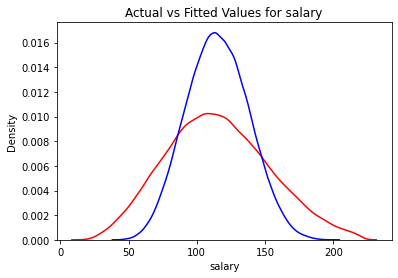

In [ ]:
sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(pred_test_rr, hist=False, color="b", label="Fitted Values")


plt.title('Actual vs Fitted Values for salary')



plt.show()
plt.close()

In [ ]:
#Parameter Tuning & Ridge Regression
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

folds=KFold(n_splits=5,shuffle=True,random_state=42)
params={'alpha':[0.001,0.01,0.1,0.2,0.5,0.9,1.0,5.0,10.0,20.0]}
model=Ridge()
model_cv=GridSearchCV(estimator=model,param_grid=params,cv=folds,scoring='r2',return_train_score=True,verbose=1)
model_cv.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.8s finished


GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             error_score=nan,
             estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True,
                             max_iter=None, normalize=False, random_state=None,
                             solver='auto', tol=0.001),
             iid='deprecated', n_jobs=None,
             param_grid={'alpha': [0.001, 0.01, 0.1, 0.2, 0.5, 0.9, 1.0, 5.0,
                                   10.0, 20.0]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='r2', verbose=1)

In [ ]:
model_cv.best_params_

{'alpha': 10.0}

In [ ]:
ridg=Ridge(10.0)
ridg.fit(X_train,y_train)

Ridge(alpha=10.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [ ]:
y_pred_ridg=ridg.predict(X_test)

In [ ]:
r2_ridge=r2_score(y_test,y_pred_ridg)

In [ ]:
r2_ridge

0.36809836190277934

In [ ]:
mse = mean_squared_error(y_test, y_pred_ridg)

In [ ]:
mse

893.8619966339832

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


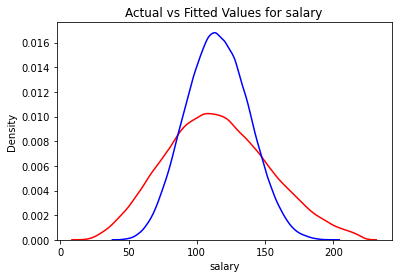

In [ ]:
sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred_ridg, hist=False, color="b", label="Fitted Values")
plt.title('Actual vs Fitted Values for salary')
plt.show()

In [ ]:
#HyperParameter Tuning using RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [ ]:
#Decision Tree with hyperparameter tuning
regressor = DecisionTreeRegressor(max_depth=90,max_features=6,min_samples_leaf=4,min_samples_split=200,random_state=42)
regressor.fit(X_train,y_train)
y_pred_dt = regressor.predict(X_test)
mse=mean_squared_error(y_test,y_pred_dt)
r2=r2_score(y_test,y_pred_dt)

In [ ]:
mse

407.64578073184487

In [ ]:
r2

0.7118212458098814

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


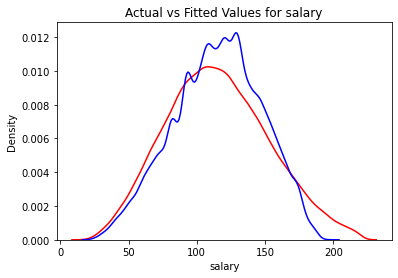

In [ ]:
sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred_dt, hist=False, color="b", label="Fitted Values")
plt.title('Actual vs Fitted Values for salary')
plt.show()

In [ ]:
#RandomForestRegression with hyperparameter tuned
rf = RandomForestRegressor(max_depth=90,max_features=3,min_samples_leaf=4,min_samples_split=10,n_estimators=100)
rf.fit(X_train,y_train)
y_pred_rf_hp=rf.predict(X_test)
r2_rf=r2_score(y_test,y_pred_rf_hp)
mse=mean_squared_error(y_test,y_pred_rf_hp)

In [ ]:
r2_rf

0.7394096161208652

In [ ]:
mse

368.6204098777508

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


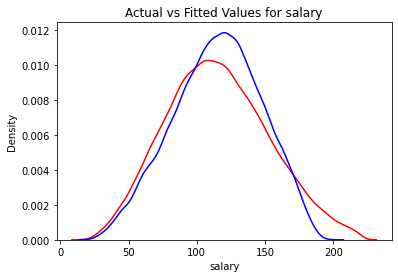

In [ ]:
sns.distplot(y_test, hist=False, color="r", label="Actual Value")
sns.distplot(y_pred_rf_hp, hist=False, color="b", label="Fitted Values")
plt.title('Actual vs Fitted Values for salary')
plt.show()

In [ ]:
#Converting series to array
y_t=y_test.values

In [ ]:
#Combining two arrays
y_final = y_t, np.round(y_pred_rf_hp,2)
y_final

(array([123, 218,  80, ..., 110, 154, 147]),
 array([123.89, 183.56,  89.54, ..., 103.52, 173.13, 105.73]))

In [ ]:
result = pd.DataFrame(list(y_final))
result

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [ ]:
result = pd.DataFrame(list(y_final))
result = result.transpose()
result.columns = ["Actual Salary", "Predicted Salary"]
result.head(10)

,Actual Salary,Predicted Salary
0,123.0,123.89
1,218.0,183.56
2,80.0,89.54
3,125.0,125.09
4,73.0,81.84
5,114.0,160.47
6,154.0,165.76
7,167.0,143.18
8,64.0,56.27
9,143.0,157.87
